# Practice: First, Hydro-dynamical PDE models

As modelers of stellar atmospheres, we are primarily interested in solving the equations of mass, momentum, and energy balance, along with the equations governing the evolution of the magnetic field, the transport equations for the radiation field, heat flux equations, etc. For this project, we will start with the hydrodynamic equations in 1 dimension as follows: 

$$ \frac{\partial \rho}{\partial t} + \nabla \cdot (\rho \bf u) = 0 $$

$$ \frac{\partial \rho {\bf u}}{\partial t} + \nabla \cdot (\rho {\bf u} \otimes {\bf u}) = - \nabla (P_g)$$

$$ \frac{\partial e}{\partial t } = -\nabla\cdot e {\bf u} -P_g \nabla \cdot {\bf u}$$

where $\rho$, $\bf u$, $P_g$, and $e$ are the density, velocity vector, gas pressure, and internal energy. $\cdot$ and $\otimes$ are the dyadic and tensorial product, respectively. One extra equation needs to connect the pressure with the energy. For this you can use $P_g  = (\gamma-1)e/\rho$ where $\gamma=5/3$. Note that, in 1 dimension the operation  $\nabla \cdot (\rho {\bf u} \otimes {\bf u})$ becomes as follows: 

$$ \nabla \cdot (\rho {\bf u} \otimes {\bf u}) = \frac{\partial (\rho u^2)}{\partial x} $$

## 1- Build or select your code 

In this exercise, you can select one of the following options: 

1. Build your hydro-dynamical (HD) numerical code applying the tools/functions learned during the 6th different assessment. Solve the above set of equations in one dimension. 

    __A plus__ implement the [Bifrost 6th order spatial derivative, 5th order spatial interpolation](https://github.com/AST-Course/AST5110/wiki/Discretization) with the hyper-diffusion scheme (see [wiki](https://github.com/AST-Course/AST5110/wiki/Hyper-diffusive)). Note that Bifrost is using a [staggered mesh](https://github.com/AST-Course/AST5110/wiki/Staggered-mesh) where the density, pressure, energy, and temperature are cell-centered, and velocity and momentum are at the edges (in 1 dimension). 

    __A plus__ implement the [Flux limiter method](https://github.com/AST-Course/AST5110/wiki/Flux-limiter-method).

    __A plus__ implement the [Rieman Solver method](https://github.com/AST-Course/AST5110/wiki/Rieman-Solver-method).

    What would you choose for the CFL condition? 

2. Use the Bifrost, Ebysus, or other numerical codes you are interested in learning. 

    Note that I can help only with the numerical codes that I'm familiar with, but you should still select the ones you are interested in as long as you have access to them. 

    Johannes: Since you do this excersize with an existing code. You will need to investigate, spatial derivative order and temporal orders. Fully test with Riemann solvers. As well as investigate the k-diagrams for a test that has initial random perturbations in density/velocity. 

## 2- Test the code

Set your code to run a 1D problem using the following initial conditions. The fluid is initially at rest on either side of a density and pressure jump. To the left, respectively right side of the interface, we have: 

$\rho_L = 0.125$

$\rho_R = 1.0$

$Pg_L = 0.125/\gamma$

$Pg_R = 1.0/\gamma$

The ratio of specific heats is chosen to be $\gamma = 5/3$ on both sides of the interface. The units are normalized, with the density and pressure in units of the density and pressure on the left-hand side of the jump and the velocity in units of the sound speed. The length unit is the size of the domain and the time in units of the time required to cross the domain at the speed of sound.

What boundary conditions would you choose?
What do you see? 

This is known as the Sod-shock tube test [Sod et al. 1978](https://ui.adsabs.harvard.edu/abs/1978JCoPh..27....1S/abstract), a standard test in computational HD codes. It consists of a one-dimensional flow discontinuity problem that provides a good test of a compressible code’s ability to capture shocks and contact discontinuities within a few grid zones and produce the correct density profile in a rarefaction or expansion wave. The test can also be used to check if the code can satisfy the Rankine-Hugoniot shock jump conditions since this test has an analytical solution. If you have access, you can also look at _Computational Gasdynamics book from Culbert B. Laney_ Section 5. However, many other books will describe this problem in detail. 
 
Compare the simulation with the analytical solution. This could be used for a sanity test after new additions to the code. 

__Suggestion__ This test might be too complex to debug the code. However, as a starting debugging test, you can consider an advection test (constant initial velocity) of a gaussian density perturbation in pressure balance. 

 Johannes: In addition, add and 1D MHD Roe tests. 

## 3-  Two system of equations: two fluids (Gaute Arnesson Holen). 

The chromosphere, transition region and corona are weakly collisional. Therefore, different fluids or species can experience different forces and consequently drift with other fluids. As a result, under these conditions, single fluid equations are not accurate enough. The presence of velocity drift between fluids could be eventually dissipate and heat the plasma. 

Duplicate the HD equations and couple them with the momentum and energy exchange as follows: 

$ \frac{\partial \rho_\alpha}{\partial t} + \nabla \cdot (\rho_\alpha \bf u_\alpha) = 0 $

$ \frac{\partial \rho_\alpha {\bf u_\alpha}}{\partial t} + \nabla \cdot (\rho_\alpha {\bf u_\alpha} \otimes {\bf u_\alpha}) = - \nabla (P_{g\alpha}) + \rho_\alpha \nu_{\alpha\beta}(u_\alpha-u_\beta)$

$ \frac{\partial e_\alpha}{\partial t } = -\nabla\cdot e_\alpha {\bf u_\alpha} -P_{g\alpha} \nabla \cdot {\bf u_\alpha} + Q_{\alpha}^{\alpha\beta}$

where $\alpha= [i,n]$ and $\beta$ refer either to ions $i$ or neutrals $n$. For simplicity, lets assume hydrogen and protons and consider to impose a fix collision frequency. Due to conservation $\rho_\alpha \nu_{\alpha\beta}=\rho_\beta \nu_{\beta\alpha}$. 


$Q_{\alpha}^{\alpha\beta} = \frac{n_{\alpha} m_{\alpha} \nu_{\alpha \beta}}{m_{\alpha}+m_{\beta}} \left[m_{\beta}(\vec{u}_\beta - \vec{u}_\alpha)^2+\frac{2 k_B}{\gamma-1} \left(T_{\beta}-T_{\alpha}\right)\right]$

where $m_{\alpha\beta} = \frac{m_{\alpha}m_{\beta}}{m_{\alpha}+m_{\beta}}$, and for this exercise, since we assume only hydrogen, $m_\alpha \approx m_\beta$ is a good proxy. 

For further description of multicomponent fluids see e.g. the book by [Zhdanov 2002](https://ui.adsabs.harvard.edu/abs/2002PPCF...44.2283Z/abstract), [Khomenko et al 2014](https://ui.adsabs.harvard.edu/abs/2014PhPl...21i2901K/abstract). 


#### 3a- Test the code: 

Consider the following tests to validate the implementation: 

    1) Consider an scenario with no heating sources and constant collision frequency. In that case, it is simple to compute the slope in loglog scale of the velocity drift. 
        1a) What would happen in you turn $Q^{\alpha\beta}_\alpha$ on? 
    2) Assuming zero velocity drift, what would be the temperature evolution when the two fluids are different?     

### 4- Energy dissipated in the chromosphere. 

Ion-neutral interaction cans play a big role on dissipating the magnetic energy. The figure below reveals the collision frequency parameter range within the chromosphere. A zero order of the velocity drift can be found in [Martinez-Sykora et al 2016](https://iopscience.iop.org/article/10.3847/2041-8205/831/1/L1/pdf) Fig. 4b. Use the numerical code to provide a better understanding on the time-scale of the heating and damping mechanism within the chromosphere. 

<img src="./figure_log.png" />

__bonus__ One can compute the collision frequency as follows: 

$\nu^{\text{col,L}}_{\alpha, \beta}=\frac{m_{\alpha,\beta}}{m_{\beta}} n_{\beta} u^{th}_{\alpha,\beta}\, \sigma_{\alpha,\beta}\left(T_{\alpha,\beta}\right)$

where $T_{\alpha,\beta} =(m_{\alpha} T_{\alpha}+m_{\beta} T_{\beta} )/(m_{\alpha}+m_{\beta})$ is the weigthed temperature, $u^{th}_{\alpha,\beta} = |\sqrt{\frac{8}{\pi\mu_{\alpha,\beta}}}|$ is the thermal velocity with $\mu_{\alpha,\beta} = \frac{\mu_{\alpha}\,\mu_{\beta}}{\mu_{\alpha}+\mu_{\beta}}$ and $\mu_{\alpha} = \frac{m_\alpha}{K_B T_\alpha}$. $K_B$ is the Boltzmann constant. The cross-section ($\sigma_{\alpha,\beta}(\left(T_{\alpha,\beta}\right)$) are tabulated as a function of temperature and for this exersize you can use the one from [Bruno et al. 2010](https://aip.scitation.org/doi/10.1063/1.3495980). Ask me for the table. 
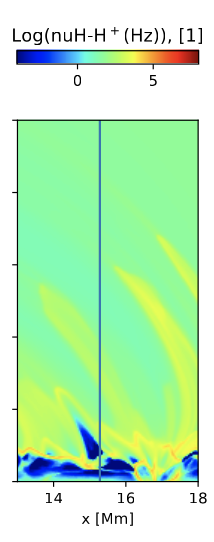

First, we build the numerical object oriented codes for multiple species first uncoupled i.e no $\rho_\alpha \nu_{\alpha\beta}(u_\alpha-u_\beta)$ and $Q_{\alpha}^{\alpha\beta}$ terms. We set up the two species with the same sod test tube setup, but flip the pressure and and density profiles for the second species. 

# Implementing the CFD equations and sod test tube

The first step is to implement the momentum, density and energy equations listed above.

The first issue we encounter is speeds far exceeding the speed of sound, quickly breaking the simulation. A flux limiter is a good way to deal with this, but for now we simply set a speed limit after the update such that:

$$
u_j^{n+1} = min(c_j^{n},u_j^{n+1})
$$

Where $c_j$ is the speed of sound given by:
$$
c = \sqrt{\frac{\gamma P_g}{\rho}}
$$
 This leads to a noisy but mostly stable test tube simulation seen below. The analytical solution is based on the package sodshock from https://github.com/ibackus/sod-shocktube. This repository is a fork of the Riemann solver implemented at https://gitlab.com/fantaz/Riemann_exact, which is itself just a pythonic clone of the fortran code by Bruce Fryxell.

In [1]:
import numpy as np
import nm_lib as nm
from matplotlib import style
#style.use('dark_background')

/Users/gauteholen/opt/anaconda3/lib/python3.9/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [4]:
nump = 256
cfl_cut = 0.1
Nt = 1000
gamma = 5/3

xx,u,rho,Pg = nm.init_sod_test(nump,1.0,0.125,1.0/gamma,0.125/gamma)

solver = nm.Multispecies(xx,nm.deriv_cent,bnd_limits = [8,8],bnd_type="edge")
solver.add_species("Central Difference",u,rho,Pg,gamma)

t,xx,values = solver.run(Nt,cfl_cut=cfl_cut)
values.append(nm.ana_sod_shock(xx,gamma,t, Pg[0],Pg[-1],rho[0],rho[-1]))

names,uts,rhots,Pts,ets = nm.unpack_CFD_values(values)
nm.animMultMHDparams(names,ets,uts,rhots,Pts,t[:],xx,n_frames=30, figsize=(10,7))


Adding species Central Difference of type h
Running with scheme deriv_cent


# Using fft to look for oscillations

(1000,)
(1000,)


(-20.0, 20.0)

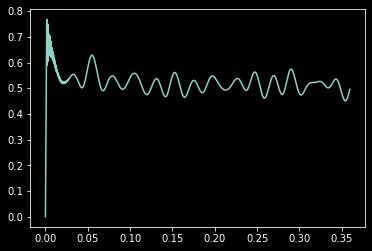

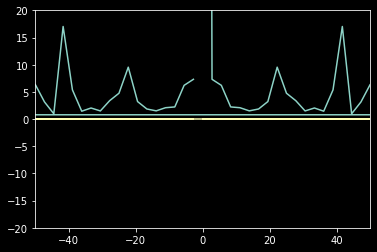

In [113]:
import matplotlib.pyplot as plt


ut = uts[0]
print(ut[:,12].shape)

t_grid = np.linspace(t[0],t[-1],num=len(t))

plt.plot(t,ut[:,128])

plt.figure()
sp = np.fft.fft(ut[:,128])
sp=np.abs(sp)
print(sp.shape)
freq = np.fft.fftfreq(t.shape[-1], d = t_grid[1]-t_grid[0])
plt.plot(freq, sp.real, freq, sp.imag)
plt.xlim(-50,50)
plt.ylim(-20,20)

(1000,)
(257,)


(-20.0, 20.0)

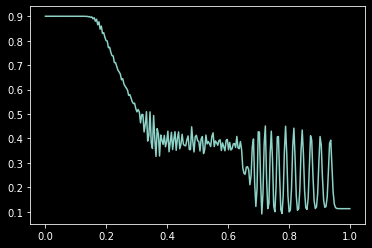

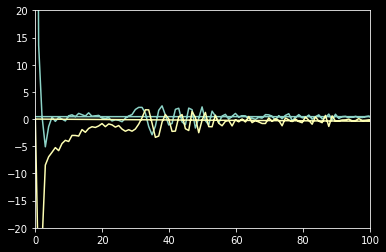

In [121]:
import matplotlib.pyplot as plt


ut = ets[0]
print(ut[:,12].shape)

t_grid = np.linspace(t[0],t[-1],num=len(t))

plt.plot(xx,ut[900,:])

plt.figure()
sp = np.fft.fft(ut[900,:])
#sp=np.abs(sp)
print(sp.shape)
dx = xx[1]-xx[0]
freq = np.fft.fftfreq(xx.shape[-1], d = dx)
plt.plot(freq, sp.real, freq, sp.imag)
plt.xlim(0,100)
plt.ylim(-20,20)

(1000,)
0.0003597309389416239
347.4819273754061


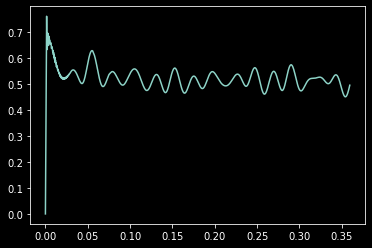

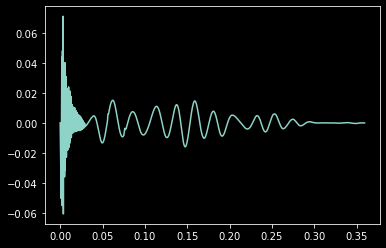

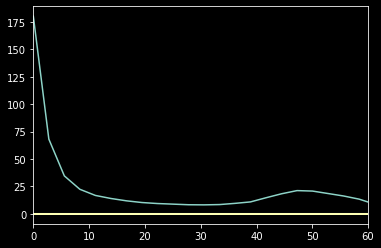

In [112]:
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d


ut = uts[0]
print(ut[:,12].shape)

t_grid = np.linspace(t[0],t[-1],num=len(t))
u_interp = interp1d(t,ut[:,128],kind="cubic")
plt.plot(t_grid,u_interp(t_grid))

plt.figure()
plt.plot(t,u_interp(t_grid)-ut[:,128])

plt.figure()
dt = t_grid[1]-t_grid[0]
sp=np.zeros(Nt, dtype=np.complex128)
for i in range(0,256):
    u_interp = interp1d(t,ut[:,i],kind="cubic")
    sp += np.abs(np.fft.fft(u_interp(t_grid)))

sp /= len(xx)
freq = np.fft.fftfreq(t.shape[-1], d = dt)
print(dt)
plt.plot(freq, sp.real, freq, sp.imag)
plt.xlim(0,60)
#plt.ylim(0,30)
print(1/(8*dt))

# Adding diffusion

The first problem we tackle is the noise. Oscillations in Computational Fluid Dynamics (CFD) is a very common problem, especially when dealing with shocks such as the sod tube test. Here, we will deal with the oscillations by implementing diffusion to our equations.

### Artificial viscocity added to the pressure term

We add the diffusive term $q$ to the pressure term in the momentum and energy equation. This is known as adding artificial viscocity, and was first done by Richtmayer and Von Neumann in the 1950s:

$$
q_{RvN} = - \rho c_q \Delta x^2 \frac{\partial ^2 u}{\partial x^2}
$$

Since then, there has been improvements, briefly outlined by L. G. Margolin · N. M. Lloyd–Ronning https://arxiv.org/pdf/2202.11084.pdf where a first order term is added. Here, we have decided to use a slightly modified version of it such that:

$$
q = - \rho \left( c_q \Delta x^2 \frac{\partial ^2 u}{\partial x^2} + c_L \Delta x \frac{\partial u}{\partial x} \right)
$$

Where $c_q$ and $c_L$ are unitless values decided by the user determining the shape of the shock. Playing around we found that $c_q = 0.5$ and $c_L = 3$ seem to be good values.

In [2]:
import warnings
warnings.filterwarnings('ignore') #One of the cases blow up so theres so many warnings...

nump = 256
cfl_cut = 0.1
Nt = 2000

gamma = 5/3

xx,u,rho,Pg = nm.init_sod_test(nump,1.0,0.125,1.0/gamma,0.125/gamma)

solver = nm.Multispecies(xx,nm.deriv_4tho,bnd_limits = [8,8],bnd_type="edge")
solver.add_species("diffusive cq=0.5, cL = 3",u,rho,Pg,gamma, cq = 0.5, cL = 3, cD = 0)
solver.add_species("diffusive cq=1, cL = 1",u,rho,Pg,gamma, cq = 1, cL = 1, cD = 0)
solver.add_species("diffusive cq=2, cL = 2",u,rho,Pg,gamma, cq = 2, cL = 2, cD = 0)

t,xx,values = solver.run(Nt,cfl_cut=cfl_cut,coupled=False, Q_col = False, col = False)
values.append(nm.ana_sod_shock(xx,gamma,t, Pg[0],Pg[-1],rho[0],rho[-1]))

names,uts,rhots,Pts,ets = nm.unpack_CFD_values(values)
nm.animMultMHDparams(names,ets,uts,rhots,Pts,t,xx,n_frames=35, ylim=[0,1], figsize = (10,7))

Adding species diffusive cq=0.5, cL = 3 of type h
Adding species diffusive cq=1, cL = 1 of type h
Adding species diffusive cq=2, cL = 2 of type h
Running with scheme deriv_4tho


Above we see that the shockwave no longer causes the simulation to blow up if we have the right values for $c_q$ and $c_L$. However, there are still some oscillations in the density. This makes sense, as the diffusive terms were only added to the momentum and energy equations, while the density is free to oscillate without diffusion.

### Density diffusive term

Inspired by the R-v-N diffusive terms, a second term is added to the density in the continuity equation:
$$
q_d = D \frac{\partial \rho u}{\partial x}
$$

Where $D = c_D \Delta x \rho$ and $c_D$ is some unitless constant set by the user (1 by default). Our new set of diffusive equations are:


$$ \frac{\partial \rho}{\partial t} + \nabla \cdot ((\rho + q_d) \bf u )= 0 $$

$$ \frac{\partial \rho {\bf u}}{\partial t} + \nabla \cdot (\rho {\bf u} \otimes {\bf u}) = - \nabla (P_g + q)$$

$$ \frac{\partial e}{\partial t } = -\nabla\cdot e {\bf u} -(P_g + q) \nabla \cdot {\bf u}$$

Now, the CFD noise is redused to a point where our simulation can handle shocks very well as we can see in the plot below:

In [1]:
import numpy as np
import nm_lib as nm
from matplotlib import style
#style.use('dark_background')

In [3]:
nump = 256
cfl_cut = 0.1
Nt = 4000
gamma = 5/3

xx,u,rho,Pg = nm.init_sod_test(nump,1.0,0.125,1.0/gamma,0.125/gamma)

solver = nm.Multispecies(xx,nm.deriv_4tho,bnd_limits = [8,8],bnd_type="edge")
solver.add_species("diffusive cq=0.5, cL = 3, cD = 1",u,rho,Pg,gamma, cq = 2, cL = 3, cD = 2)

t,xx,values = solver.run(Nt,cfl_cut=cfl_cut,coupled=False, Q_col = False, col = False)
values.append(nm.ana_sod_shock(xx,gamma,t, Pg[0],Pg[-1],rho[0],rho[-1]))

names,uts,rhots,Pts,ets = nm.unpack_CFD_values(values)
nm.animMultMHDparams(names,ets,uts,rhots,Pts,t,xx,n_frames=35, ylim=[0,1], figsize=(10,7))

Adding species diffusive cq=0.5, cL = 3, cD = 1 of type h
Running with scheme deriv_4tho


In [4]:
print(max(t)/Nt)

0.0007181868719593628


# Conservative methods


#  Lax-Wendroff scheme

In [2]:
import numpy as np
import nm_lib as nm
import matplotlib.pyplot as plt
from matplotlib import style
#style.use('dark_background')

d = 2.89e-12
m = 1.67262192e-27

nump = 256
cfl_cut = 0.5
Nt = 1000
gamma = 5/3

xx,u,rho,Pg = nm.init_sod_test(nump,1.0,0.125,1.0/gamma,0.125/gamma)

solver = nm.Multispecies(xx,nm.deriv_4tho,bnd_limits = [2,2],bnd_type="edge")
solver.add_species("Lax-Wendroff",u,rho,Pg,gamma, cq = 2, cL = 3, cD = 2, d = d, m=m)
#solver.add_species("Flux Lax Wendroff",u,rho,Pg,gamma, cq = 2, cL = 3, cD = 2, d = d, m=m)
#solver.add_species("RL",u2,rho,Pg,gamma, m = m, cq = 0.5, cL = 3, cD = 1)

t,xx,values = solver.run(Nt,cfl_cut=cfl_cut,coupled=False,conservative = True, flux_algo = "LF")

values.append(nm.ana_sod_shock(xx,gamma,t, Pg[0],Pg[-1],rho[0],rho[-1], conserv=True))

names,uts,rhots,Pts,ets = nm.unpack_CFD_values(values)
nm.animMultMHDparams(names,ets,uts,rhots,Pts,t,xx,n_frames=35, ylim=[0,1], figsize=(10,7))

Adding species Lax-Wendroff of type h
Running with scheme LF
Animating CFD params 



# Roe Scheme

In [3]:
import numpy as np
import nm_lib as nm
import matplotlib.pyplot as plt
from matplotlib import style
#style.use('dark_background')

d = 2.89e-12
m = 1.67262192e-27

nump = 256
cfl_cut = 0.5
Nt = 1000
gamma = 5/3

xx,u,rho,Pg = nm.init_sod_test(nump,1.0,0.125,1.0/gamma,0.125/gamma)

solver = nm.Multispecies(xx,nm.deriv_4tho,bnd_limits = [2,2],bnd_type="edge")
solver.add_species("Flux Roe",u,rho,Pg,gamma, cq = 2, cL = 3, cD = 2, d = d, m=m)
#solver.add_species("Flux Lax Wendroff",u,rho,Pg,gamma, cq = 2, cL = 3, cD = 2, d = d, m=m)
#solver.add_species("RL",u2,rho,Pg,gamma, m = m, cq = 0.5, cL = 3, cD = 1)

t,xx,values = solver.run(Nt,cfl_cut=cfl_cut,coupled=False,conservative = True, flux_algo="ROE")

values.append(nm.ana_sod_shock(xx,gamma,t, Pg[0],Pg[-1],rho[0],rho[-1], conserv=True))

names,uts,rhots,Pts,ets = nm.unpack_CFD_values(values)
nm.animMultMHDparams(names,ets,uts,rhots,Pts,t,xx,n_frames=15, figsize = (10,7))

### Navier Stokes Equation


289

In [3]:
import numpy as np
import nm_lib as nm
import matplotlib.pyplot as plt
from matplotlib import style
style.use('dark_background')

d = 2.89e-12

nump = 4
cfl_cut = 0.1
Nt = 100
gamma = 5/3

m = 1.67262192e-27

nump = 256
cfl_cut = 0.1
Nt = 100
gamma = 5/3

xx,u,rho,Pg = nm.init_sod_test(nump,1.0,0.125,1.0/gamma,0.125/gamma)

solver = nm.Multispecies(xx,nm.deriv_4tho,bnd_limits = [8,8],bnd_type="edge")
solver.add_species("diffusive cq=0.5, cL = 3, cD = 1",u,rho,Pg,gamma, cq = 2, cL = 3, cD = 2, d = d, m=m)

#solver.add_species("RL",u2,rho,Pg,gamma, m = m, cq = 0.5, cL = 3, cD = 1)

t,xx,values = solver.run(Nt,cfl_cut=cfl_cut,coupled=True, Q_col = True)

In [2]:
names,uts,rhots,Pts,ets = nm.unpack_CFD_values(values)
nm.animMultMHDparams(names,ets,uts,rhots,Pts,t[0::30],xx,n_frames=30, ylim=[0,1])

# Adding colisions


Implementing the collisions successfully proved to have a lot of challenges regarding the structure of the codes and the species. In particular, it is very important that everything is advanced in time according to the numerical schemes. In other words, the calculation of the collisions for every species has to happen before or after all the species are advanced in time. 



Adding species LR of type h
Adding species RL of type h
Loading cross section data for h-h: h-h-bruno-fits.txt
Loading cross section data for h-h: h-h-bruno-fits.txt
Loading cross section data for h-h: h-h-bruno-fits.txt
Loading cross section data for h-h: h-h-bruno-fits.txt
Running with scheme deriv_4tho


AttributeError: 'numpy.ndarray' object has no attribute 'get_sigma'

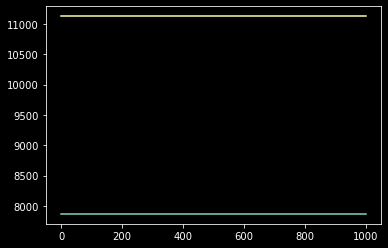

In [1]:
import numpy as np
import nm_lib as nm
import matplotlib.pyplot as plt
from matplotlib import style
style.use('dark_background')



nump = 4
cfl_cut = 0.1
Nt = 2000
gamma = 5/3

rho_chromosphere = 1e-9 #kg/m^3
T_chromosphere = 5e3
P_chromosphere = rho_chromosphere*1e10
m = 1.67262192e-27

xx,rho,Pg,u1,u2 = nm.init_vel_drift(nump,rho_chromosphere,P_chromosphere,0.5*T_chromosphere,T_chromosphere,m)



plt.plot(xx,u1)
plt.plot(xx,u2)

solver = nm.Multispecies(xx,nm.deriv_4tho,bnd_limits = [8,8],bnd_type="wrap")
solver.add_species("LR",u1,rho,Pg,gamma, m = m, cq = 0.5, cL = 3, cD = 1)
solver.add_species("RL",u2,rho,Pg,gamma, m = m, cq = 0.5, cL = 3, cD = 1)

t,xx,values = solver.run(Nt,cfl_cut=cfl_cut,coupled=True, Q_col = True)

#et,ut,rhot,Pt,t = nm.evolve_hydro(xx,u,rho,Nt,Pg,gamma,cfl_cut = cfl_cut, ddx = nm.deriv_cent, bnd_limits = [4,4],bnd_type="edge")


In [2]:
names,uts,rhots,Pts,ets = nm.unpack_CFD_values(values)
nm.animMultMHDparams(names,ets,uts,rhots,Pts,t[:173],xx,n_frames=30)
nm.plotColParams(names,uts,t)


# CrossSection class

In order to find the cross section for the collisions for each species and at each temperature there are data files that need to be read. As reading each file again for every step is slow, the following procedure is implemented:
1) Assign every species a code, "h" for hydrogen etc, corresponding to each species encoded in the cross section data files.
2) Look for the data files for each collision type for each run. If they are there the file is read to temperature and sigma arrays stored in the `CrossSection` object with a function `get_sigma(T_ab)`
3) a nxn Matrix is constructed containing each `CrossSection` object such that for species i and j we have indecies i and j corresponding to the correct `CrossSection` in the matrix.


In [1]:
import numpy as np
import nm_lib as nm
import matplotlib.pyplot as plt
from matplotlib import style
style.use('dark_background')

nump = 256
cfl_cut = 0.1
Nt = int(2e3)
gamma = 5/3
rho_chromosphere = 1e-4
P = 1e-4
d = 2.89e-12

xx,u,rho,Pg = nm.init_sod_test(nump,rho_chromosphere,rho_chromosphere*0.125,P*1.0/gamma,P*0.125/gamma)
xx*=1e3
m = 1.67262192e-27

solver = nm.Multispecies(xx,nm.deriv_4tho,bnd_limits = [8,8],bnd_type="edge")
solver.add_species("diffusive cq=0.5, cL = 3, cD = 1",u,rho,Pg,gamma, m=m, cq = 2, cL = 3, cD = 2, d = d)
solver.add_species("diffusive cq=0.5, cL = 3, cD = 1",u,np.flip(rho),np.flip(Pg),gamma,m=m, cq = 2, cL = 3, cD = 2, d = d)

t,xx,values = solver.run(Nt,cfl_cut=cfl_cut,coupled=True, Q_col = True, col = True)

names,uts,rhots,Pts,ets = nm.unpack_CFD_values(values)


Adding species diffusive cq=0.5, cL = 3, cD = 1 of type h
Adding species diffusive cq=0.5, cL = 3, cD = 1 of type h
Loading cross section data for h-h: h-h-bruno-fits.txt
Loading cross section data for h-h: h-h-bruno-fits.txt
Loading cross section data for h-h: h-h-bruno-fits.txt
Loading cross section data for h-h: h-h-bruno-fits.txt
Running with scheme deriv_4tho


/Users/gauteholen/UiO/AST9110/nm_lib/nm_lib/Multispecies.py:187: RuntimeWarning: invalid value encountered in sqrt
  c = np.sqrt(s.gamma*s.Pg/s.rho)
/Users/gauteholen/UiO/AST9110/nm_lib/nm_lib/Multispecies.py:188: RuntimeWarning: invalid value encountered in multiply
  dts = self.dx/max(abs(s.u + abs(self.dt*s.col) + c))
/Users/gauteholen/UiO/AST9110/nm_lib/nm_lib/Multispecies.py:396: RuntimeWarning: invalid value encountered in sqrt
  c = np.sqrt(gamma*Pg/rho) #Can't be zero because pressure/density can't be zero
/Users/gauteholen/UiO/AST9110/nm_lib/nm_lib/hydro.py:229: RuntimeWarning: invalid value encountered in subtract
  mom = u*rho - dt*ddx(xx,rho*u*u) - dt*ddx(xx,Pg + q) - dt*col
/Users/gauteholen/UiO/AST9110/nm_lib/nm_lib/hydro.py:229: RuntimeWarning: invalid value encountered in multiply
  mom = u*rho - dt*ddx(xx,rho*u*u) - dt*ddx(xx,Pg + q) - dt*col
/Users/gauteholen/UiO/AST9110/nm_lib/nm_lib/hydro.py:285: RuntimeWarning: invalid value encountered in multiply
  e_new = e - dt

In [2]:
nm.animMultMHDparams(names,ets,uts,rhots,Pts,t[:30],xx,n_frames=30)

In [1]:
import numpy as np
import nm_lib as nm
import matplotlib.pyplot as plt
from matplotlib import style
style.use('dark_background')

nump = 256
cfl_cut = 0.5
Nt = int(10e3)
gamma = 5/3
rho_chromosphere = 1e-4
P = 1e2
d = 2.89e-12

xx,u,rho,Pg = nm.init_sod_test(nump,rho_chromosphere,rho_chromosphere*0.125,P*1.0/gamma,P*0.125/gamma)
xx*=1e3
m = 1.67262192e-27

solver = nm.Multispecies(xx,nm.deriv_4tho,bnd_limits = [8,8],bnd_type="edge")
solver.add_species("h1",u,rho,Pg,gamma, m=m, cq = 2, cL = 3, cD = 2, d = d)
solver.add_species("h2",u,np.flip(rho),np.flip(Pg),gamma,m=m, cq = 2, cL = 3, cD = 2, d = d)

t,xx,values = solver.run(Nt,cfl_cut=cfl_cut,coupled=True, conservative = True, Q_col = True, col = True, flux_algo = "LF")

names,uts,rhots,Pts,ets = nm.unpack_CFD_values(values)
nm.animMultMHDparams(names,ets,uts,rhots,Pts,t[:],xx,n_frames=30)


/Users/gauteholen/opt/anaconda3/lib/python3.9/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


Adding species h1 of type h
Adding species h2 of type h
Loading cross section data for h-h: h-h-bruno-fits.txt
Loading cross section data for h-h: h-h-bruno-fits.txt
Running with scheme LF
Animating CFD params 0



In [1]:
import numpy as np
import nm_lib as nm
import matplotlib.pyplot as plt
from matplotlib import style
style.use('dark_background')

nump = 256
cfl_cut = 0.5
Nt = int(10e3)
gamma = 5/3
rho_chromosphere = 1e-4
P = 1e2
d = 2.89e-12

xx,u,rho,Pg = nm.init_sod_test(nump,rho_chromosphere,rho_chromosphere*0.125,P*1.0/gamma,P*0.125/gamma)
xx*=1e3
m = 1.67262192e-27

solver = nm.Multispecies(xx,nm.deriv_4tho,bnd_limits = [8,8],bnd_type="edge")
solver.add_species("h",u,rho,Pg,gamma, m=m, molecule = "h")
solver.add_species("p",u,np.flip(rho),np.flip(Pg),gamma,m=m, molecule = "p")
t,xx,values = solver.run(Nt,cfl_cut=cfl_cut,coupled=True, conservative = True, Q_col = True, col = True, flux_algo = "LW")

names,uts,rhots,Pts,ets = nm.unpack_CFD_values(values)
nm.animMultMHDparams(names,ets,uts,rhots,Pts,t[:],xx,n_frames=30)


/Users/gauteholen/opt/anaconda3/lib/python3.9/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


Adding species h of type h
Adding species p of type p
Loading cross section data for h-p: h-p-bruno-fits.txt
Loading cross section data for p-h: h-p-bruno-fits.txt
Running with scheme LF
Animating CFD params 0



# Timestep for colisions

Colisions are quite stiff, and as a result the timestep needs to be adjusted to keep the simulation from blowing up. 

hello


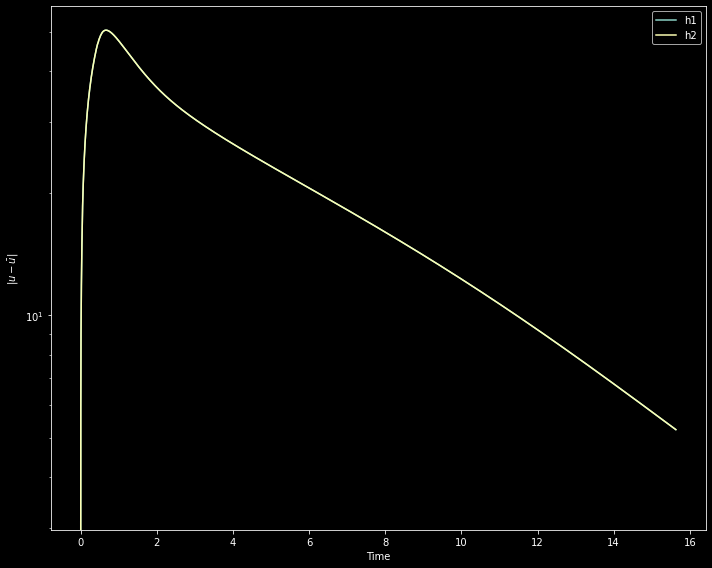

In [38]:
import importlib

importlib.reload(nm.animation)
importlib.reload(nm)
nm.plotColParams(names,uts,t)

Dissipation of heat due to velocity drift in collisions

# How to find $\Delta t$?

## No collisions $\Delta t$
Without colisions, we have
$$
\Delta t_c = \frac{\Delta x}{c}
$$
Where $c$ is the sound speed given by
$$
c = \sqrt{\frac{\gamma P_g}{\rho}}
$$
And
$$
\Delta t_u = \frac{\Delta x}{|u|}
$$
Where $u$ is the velocity such that 
$$
\Delta t = min(\Delta t_u, \Delta t_c)
$$
And the smallest value across all species is used for the timestep

## With collisions $\Delta t$

With collisions, we get the term
$$
\sum_{j=1}^{j=n} \rho_i \nu_{ij} (u_i - u_j)
$$
Which is the colision term in the momentum equation for species $i$ colliding with all species $j \in [0,n]$ and $\nabla_{ij} is the colision frequency between the ith and jth species. From the momentum equation we get that
$$
u_{col} = u + \Delta t \sum_{j=1}^{j=n} \rho_i \nu_{ij} (u_i - u_j)
$$

And the new $\Delta t_{col}$ is calculated with the new velocity $u_{col}$

## Conservative scheme

For the conservative schemes we get
$$
\Delta t = \frac{\Delta x}{|u| + c}
$$

As the collisions were implemented with the conservative scheme in mind the default behaviour of finding the new $\Delta t$ with colisions is to use the conservative scheme version with $|u| + c$

# Final equations for n species

$$
 \frac{\partial \rho_i}{\partial t} + \nabla \cdot (\rho_i \bf u_i) = 0 
$$
$$ 
\frac{\partial \rho_i {\bf u_i}}{\partial t} + \nabla \cdot (\rho_i {\bf u_i} \otimes {\bf u_i}) = - \nabla (P_{gi}) + \sum_{j=1}^{j=n} \rho_i \nu_{ij} (\bf u_i - u_j)
$$
$$
 \frac{\partial e_i}{\partial t } = -\nabla\cdot e_i {\bf u_i} -P_{gi} \nabla \cdot {\bf u_i} + \sum_{j=1}^{j=n}Q_{i}^{ij}
 $$

 Where the term $Q_i^{ij} is$ given

 $$
 Q_{i}^{ij} = \frac{n_{i} m_{i} \nu_{i j}}{m_{i}+m_{j}} \left[m_{j}(\vec{u}_j - \vec{u}_i)^2+\frac{2 k_B}{\gamma-1} \left(T_{j}-T_{i}\right)\right]
 $$

 And the collision frequency is given by

 $$
 \nu^{\text{col,L}}_{i, j}=\frac{m_{i,j}}{m_{j}} n_{j} u^{th}_{i,j}\, \sigma_{i,j}\left(T_{i,j}\right)
 $$

 Where $\sigma_{i,j}$ is the collision cross section. As such we get two nxn matrixes for colision frequency $\nu_{ij}$ and $\sigma_{ij}$

# Numerical schemes 

## Discretization 
Example with continuity equation

$$
\frac{\partial \rho}{\partial t} + \nabla \cdot (\rho \bf u) = 0
$$

Discretized in time and space such that 

$$
\frac{\rho_j^{n+1} - \rho_j^n}{\Delta t} + \frac{d}{dx} \rho_j \bf u_j = 0
$$

We obtain for next timestep $\rho_j^{n+1}$

$$
\rho_j^{n+1} = \rho_j^n - \Delta t \frac{d}{dx} \rho_j \bf u_j
$$

Here $\frac{d}{dx}$ can be a number of different schemes such as central difference etc

## Flux conservative methods

For flux conservative methods we have the equations

$$
\frac{\partial U}{\partial t} + \frac{\partial F(U)}{\partial x} = S
$$

Where S is the source term, F is the flux and U are the conserved quantities. In our case, we obtain

$$
F = \begin{pmatrix}
        \rho \mathbf{u} \\
        \rho \mathbf{u} ^2 + P_g
        
        \\ -e \mathbf{u} - P_g \mathbf{u}
    \end{pmatrix}
$$    

$$    
    U = \begin{pmatrix}
        \rho \mathbf{u}\\
        \rho \\
        e
    \end{pmatrix}
$$

And we advance in time with
$$
U^{n+1} = U^n - \frac{dt}{dx} dF
$$

Where $dF$ is the interface fluxes found with Roe or LW scheme. 

